# Supplementary Notebook for
## "PIsToN: Evaluating Protein Binding Interfaces with Transformer Networks"

This notebook provides instructions on how to download and use the pre-trained PiSToN model.

 - <b>Part 1</b>: Reading the pre-trained PiSToN model
 - <b>Part 2</b>: Applying the PiSToN to the MaSIF-test dataset
 - <b>Part 3</b>: Exploring interpretability and attention values
 - <b>Part 4</b>: Applying the PiSToN to the CAPRI score set
 

The interface images for MaSIF-test amd CAPRI-score data were pre-computed and deposited to Zenodo (https://zenodo.org/record/7528054)

Preprocessing of custom protein structures can be obtained from us upon request.

### Author:
Vitalii Stebliankin (vsteb002@fiu.edu) <br>
Bioinformatics Research Group (BioRG) <br>
Florida International University


# Part 1: Readng the PIsToN model

## Reading the PIsToN model

In [1]:
import sys

import torch
import numpy as np
from networks.PIsToN_multiAttn import PIsToN_multiAttn
from networks.ViT_pytorch import get_ml_config

MODEL_DIR='./saved_models/'
MODEL_NAME='PIsToN_multiAttn_contrast'

## Paremeters of the original training:
params = {'dim_head': 16,
          'hidden_size': 16,
          'dropout': 0,
          'attn_dropout': 0,
          'lr': 0.0001,
          'n_heads': 8,
          'neg_pos_ratio': 5,
          'patch_size': 4,
          'transformer_depth': 8,
          'weight_decay': 0.0001,
           'margin': 0,
        'temperature': 0.5}

#device=torch.device("cuda")
device=torch.device("cpu")

model_config=get_ml_config(params)
model = PIsToN_multiAttn(model_config, img_size=32,
                        num_classes=2).float().to(device)

model.load_state_dict(torch.load(MODEL_DIR + '/{}.pth'.format(MODEL_NAME), map_location=device))
model_parameters = filter(lambda p: p.requires_grad, model.parameters())
n_params = sum([np.prod(p.size()) for p in model_parameters])

print(f"Loaded PiSToN model with {n_params} trainable parameters.")

/opt/conda/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loaded PiSToN model with 92984 trainable parameters.


/opt/conda/lib/python3.9/site-packages/torch/nn/init.py:388: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


# Part 2: MaSIF test dataset

## 1. Download the MaSIF test data

In [2]:
import os

# Pre-computed interface maps:
if not os.path.exists('/data/masif_test'):
    !wget https://zenodo.org/record/7528054/files/masif_test.tar.gz -P /data/
    !tar xf /data/masif_test.tar.gz -C /data/
    !rm /data/masif_test.tar.gz
    
## List of PDB IDs:
os.makedirs('/data/lists/', exist_ok=True)
if not os.path.exists('/data/lists/masif_test_original.txt'):
    !wget https://zenodo.org/record/7528054/files/masif_test_original.txt -P /data/lists/

## 2. Create the dataset object

In [3]:
import sys

from utils.dataset import PISToN_dataset
import os
import numpy as np

GRID_DIR = '/data/masif_test/prepare_energies_16R/07-grid/'
ppi_list = os.listdir(GRID_DIR)
ppi_list = [x.split('.npy')[0] for x in ppi_list if 'resnames' not in x and '.ref' not in x]

labels = [0 if 'neg' in x else 1 for x in ppi_list]


print(f"Extracted {len(ppi_list)} complexes.")
print(f"{np.sum(labels)} acceptable and {len(labels) -np.sum(labels) } incorrect.")
masif_test_dataset = PISToN_dataset(GRID_DIR, ppi_list)

Extracted 1356 complexes.
678 acceptable and 678 incorrect.
Interaction maps shape: (1356, 13, 32, 32)
All energies shape: (1356, 13)


### Visualize an example of interface map:

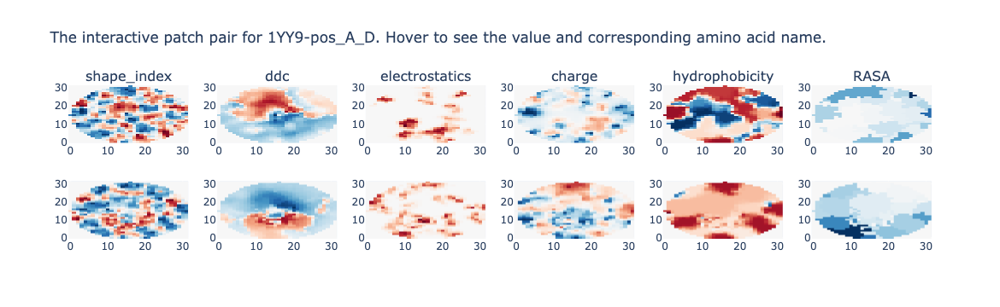

In [4]:
masif_test_dataset.vis_patch('1YY9-pos_A_D')

## 3. Obtain scores and attention maps

In [5]:
from time import time
from torch.utils.data import DataLoader
from tqdm import tqdm

start = time()

masif_test_loader = DataLoader(masif_test_dataset, batch_size=1, shuffle=False, pin_memory=False)

all_outputs = [] # output score
all_attn = [] # output attention map
predicted_labels = [] #predicted label (0 for negative and 1 for positive)

with torch.no_grad():
    for instance in tqdm(masif_test_loader):
        grid, all_energies = instance
        grid = grid.to(device)
        all_energies = all_energies.float().to(device)
        model = model.to(device)
        output, attn = model(grid, all_energies)
        all_outputs.append(output)
        all_attn.append(attn)
        if float(output)<0:
            predicted_labels.append(1)
        else:
            predicted_labels.append(0)
            
output = torch.cat(all_outputs, axis=0)
print(f"Total inference time: {time() - start} sec")

output

100%|██████████| 1356/1356 [00:41<00:00, 32.77it/s]

Total inference time: 41.378653049468994 sec


tensor([ 1.5634,  1.9313,  1.8472,  ..., -1.9156,  0.5134,  1.6997])

## 4. Plot ROC AUC and AUPRC

Final test AUC of PIsToN_multiAttn_contrast: 0.9355600804030595


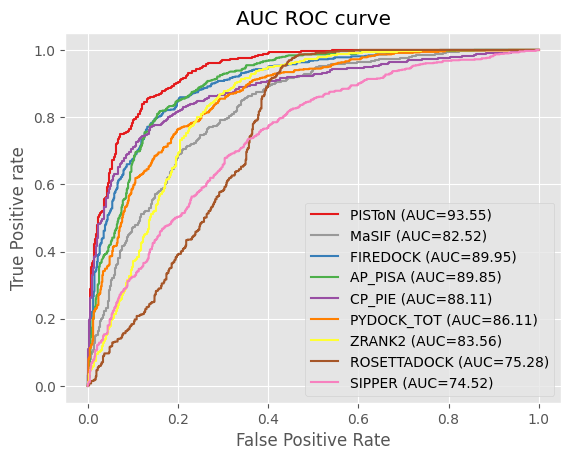

In [6]:
import torch.nn.functional as F
from sklearn import metrics
import pandas as pd


SCORES_MASIF="/data/masif_test/MaSIF-Search_scores.csv"
OTHER_SCORES="/data/masif_test/Other_tools_SCORES.csv"

os.makedirs('figures', exist_ok=True)

def plot_ROC(df, score_name, label_name, model_name, ax, color, pos_label):
    fpr, tpr, thresh = roc_curve(df[label_name], df[score_name], pos_label=pos_label)
    AUC = metrics.auc(fpr, tpr)
    ax.plot(fpr, tpr, linestyle='-',color=color, label=f'{model_name} (AUC={int(AUC*10000)/100})')

    
pred_probabilities = output.cpu().detach().numpy()
auc = metrics.roc_auc_score(labels, pred_probabilities)
print(f"Final test AUC of {MODEL_NAME}: {1-auc}")

## Save the file with all scores
all_ppis = ppi_list
out_file = f"{MODEL_DIR}/{MODEL_NAME}_scores.csv"
with open(out_file, 'w') as out:
    out.write("PPI,score,label\n")
    for i in range(len(pred_probabilities)):
        out.write(f"{all_ppis[i]},{pred_probabilities[i]},{labels[i]}\n")

scores_df = pd.read_csv(out_file)
scores_masif = pd.read_csv(SCORES_MASIF)
scores_other = pd.read_csv(OTHER_SCORES)

# matplotlib
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('ggplot')

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

colors = matplotlib.cm.Set1(range(9))


fig, ax = plt.subplots()
plot_ROC(scores_df, 'score', 'label', 'PISToN', ax, colors[0], pos_label=0)
plot_ROC(scores_masif, 'score', 'label', 'MaSIF', ax, colors[8], pos_label=0)

other_labels = ['FIREDOCK', 'AP_PISA', 'CP_PIE', 'PYDOCK_TOT', 'ZRANK2', 'ROSETTADOCK', 'SIPPER']
pos_label = [0,0,1,0,0,0,1]
colors_array = ['r', 'c', 'm', 'y', 'black', 'orange', 'tan']
for i in range(len(other_labels)):
    plot_ROC(scores_other, other_labels[i], 'Label', other_labels[i], ax, colors[i+1], pos_label=pos_label[i])



# # title
plt.title('AUC ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig(f'/results/out_AUC_{MODEL_NAME}.png',dpi=600)
plt.show();

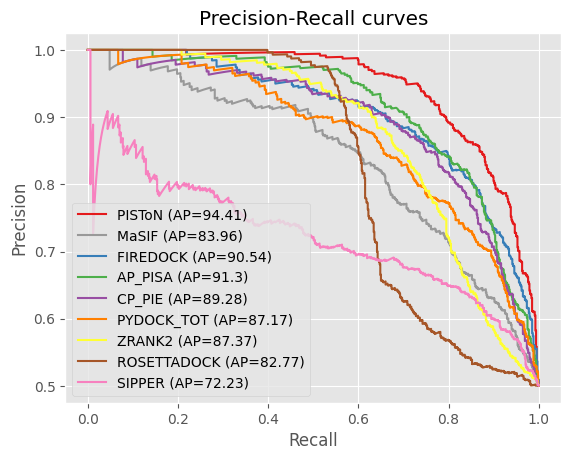

In [7]:
from sklearn.metrics import precision_recall_curve, auc, average_precision_score

def plot_AUPRC(df, score_name, label_name, model_name, ax, color, reverse_sign=False):
    # Precision-Recall curve
    pred_scores = - df[score_name] if reverse_sign else df[score_name]
    precision, recall, thresholds = precision_recall_curve(df[label_name], pred_scores)
    AP = average_precision_score(df[label_name], pred_scores)
    ax.plot(recall, precision, linestyle='-',color=color, label=f'{model_name} (AP={int(AP*10000)/100})')      


fig, ax = plt.subplots()
plot_AUPRC(scores_df, 'score', 'label', 'PISToN', ax, colors[0], reverse_sign=1)
plot_AUPRC(scores_masif, 'score', 'label', 'MaSIF', ax, colors[8], reverse_sign=1)

reverse_sign = [1,1,0,1,1,1,0]

for i in range(len(other_labels)):
    plot_AUPRC(scores_other, other_labels[i], 'Label', other_labels[i], ax, colors[i+1], reverse_sign=reverse_sign[i])

# # title
plt.title('Precision-Recall curves')
# x label
plt.xlabel('Recall')
# y label
plt.ylabel('Precision')

plt.legend(loc='best')
plt.savefig(f'/results/out_AUPRC_{MODEL_NAME}.png',dpi=600)
plt.show();

## 5. Classification metrics


Even though protein scoring functions aim to distinguish native and decoy docking structures, evaluation of classification power is a non-trivial task. Establishing optimal classification threshold depends on the dataset distribution and the desired balance between true positives, false positives, false negatives, and true negatives. The classification threshold was chosen to maximize the Matthews correlation coefficient with 10-fold cross-validation on a test set, as proposed previously in the virtual screening application.


Reference:
https://www.pnas.org/doi/10.1073/pnas.2000585117



In [8]:
from sklearn.metrics import matthews_corrcoef, f1_score, balanced_accuracy_score, auc, precision_score, recall_score
import random

def find_threshold_one_fold(df, score_name, label_name):
    precision, recall, thresholds = precision_recall_curve(df[label_name], df[score_name])
    max_matthews = 0
    optimal_threshold = 0
    labels = df[label_name]
    for thr in thresholds:
        pred_labels = df[score_name].apply(lambda x: int(x>thr))
        matthews = matthews_corrcoef(labels, pred_labels)
        if matthews>max_matthews:
            max_matthews = matthews
            optimal_threshold = thr
    return optimal_threshold, max_matthews

def find_optimal_threshold(df, score_name, label_name, reverse_sign=True):
    """
    df - dataframe with binding scores
    score_name - column name with binding scores
    label name - column name with true labels
    if reverse_sign, than we assume that lower values represent the better score
    ----
    return: optimal threshold
    """
    df = df.copy()
    if reverse_sign:
        df[score_name] = - df[score_name]

    all_thresholds = []
    all_matthews = []
    shuffled = df.sample(frac=1, random_state=15)
    all_chunks = np.array_split(shuffled, 10)
    labels = df[label_name]
    for cv_df in all_chunks:
        cv_optimal, cv_matthews = find_threshold_one_fold(cv_df, score_name, label_name)
        all_thresholds.append(cv_optimal)
        all_matthews.append(cv_matthews)
        
    optimal_threshold = np.mean(all_thresholds)
    pred_labels = df[score_name].apply(lambda x: int(x>optimal_threshold))
    balanced_accuracy = balanced_accuracy_score(labels, pred_labels)
    f1 = f1_score(labels, pred_labels)
    precision = precision_score(labels, pred_labels)
    recall = recall_score(labels, pred_labels)
    
    if reverse_sign:
        all_thresholds = [-x for x in all_thresholds]
        optimal_threshold = np.mean(all_thresholds)

    print(f"Optimal threshold: {optimal_threshold}; BA={balanced_accuracy}, F1={f1}, Precision={precision}; Recall={recall}")
    return all_thresholds, all_matthews, [balanced_accuracy, f1, precision, recall]

all_results = []
all_thresholds = []
all_matthews = []
print("PIsToN")
thresholds, matthews, metrics = find_optimal_threshold(scores_df, 'score', 'label')
all_results.append(['PIsToN']+metrics)
all_thresholds.append(['PIsToN']+thresholds)
all_matthews.append(['PIsToN']+matthews)

print("")
print("MaSIF")
thresholds, matthews, metrics = find_optimal_threshold(scores_masif, 'score', 'label')
all_results.append(['MaSIF']+metrics)
all_thresholds.append(['MaSIF']+thresholds)
all_matthews.append(['MaSIF']+matthews)

for i in range(len(other_labels)):
    print("")
    print(other_labels[i])
    thresholds, matthews, metrics = find_optimal_threshold(scores_other, other_labels[i], 'Label', reverse_sign=reverse_sign[i])
    all_results.append([other_labels[i]]+metrics)
    all_thresholds.append([other_labels[i]]+thresholds)
    all_matthews.append([other_labels[i]]+matthews)
    
metrics_df = pd.DataFrame(all_results, columns=['Method','BA','F1', 'Precision', 'Recall'])
metrics_df.to_csv('/results/classification_masif_test.csv', index=False)
metrics_df

PIsToN
Optimal threshold: 0.9798397362232208; BA=0.8561946902654867, F1=0.8548026805658973, Precision=0.8631578947368421; Recall=0.8466076696165191

MaSIF
Optimal threshold: 2.071556639671326; BA=0.749266862170088, F1=0.72508038585209, Precision=0.802491103202847; Recall=0.6612903225806451

FIREDOCK
Optimal threshold: -14.928; BA=0.8183256548863691, F1=0.8157503714710252, Precision=0.8280542986425339; Recall=0.8038067349926794

AP_PISA
Optimal threshold: -0.16376999999999997; BA=0.8198080316698368, F1=0.812785388127854, Precision=0.8462757527733756; Recall=0.7818448023426061

CP_PIE
Optimal threshold: 0.8183475999999998; BA=0.810296561229353, F1=0.7993803253292022, Precision=0.8486842105263158; Recall=0.7554904831625183

PYDOCK_TOT
Optimal threshold: -14.026900000000001; BA=0.7765582667462421, F1=0.7762289068231842, Precision=0.7779411764705882; Recall=0.7745241581259151

ZRANK2
Optimal threshold: -120.33934000000002; BA=0.7788553603860835, F1=0.7436332767402377, Precision=0.8848484848

,Method,BA,F1,Precision,Recall
0,PIsToN,0.856195,0.854803,0.863158,0.846608
1,MaSIF,0.749267,0.725080,0.802491,0.661290
2,FIREDOCK,0.818326,0.815750,0.828054,0.803807
3,AP_PISA,0.819808,0.812785,0.846276,0.781845
4,CP_PIE,0.810297,0.799380,0.848684,0.755490
5,PYDOCK_TOT,0.776558,0.776229,0.777941,0.774524
6,ZRANK2,0.778855,0.743633,0.884848,0.641288
7,ROSETTADOCK,0.760591,0.698061,0.945000,0.553441
8,SIPPER,0.686406,0.703190,0.667984,0.742313


In [9]:
## optimal thresholds
thresholds_df = pd.DataFrame(all_thresholds, columns=['Method']+list(range(1,11)))
thresholds_df.to_csv('/results/thresholds_masif_test.csv', index=False)
thresholds_df

,Method,1,2,3,4,5,6,7,8,9,10
0,PIsToN,0.438491,1.472017,0.670179,0.603302,1.014952,1.022530,1.268599,1.090225,1.068424,1.149678
1,MaSIF,2.039356,1.926006,2.217310,1.883726,2.172627,2.181533,1.974291,2.066301,1.923109,2.331308
2,FIREDOCK,-12.060000,-10.260000,-15.660000,-11.080000,-8.410000,-12.550000,-29.020000,-24.360000,-9.840000,-16.040000
3,AP_PISA,-0.225700,-0.143500,-0.129600,-0.185500,-0.155100,-0.145500,-0.128800,-0.218900,-0.176500,-0.128600
4,CP_PIE,0.951800,0.614134,0.836779,0.871953,0.809453,0.747940,0.825216,1.009125,0.664521,0.852555
5,PYDOCK_TOT,-16.420000,-18.322000,-19.029000,-7.520000,-9.507000,-12.644000,-19.589000,-12.924000,-16.735000,-7.579000
6,ZRANK2,-95.195100,-88.455100,-177.567000,-79.961500,-124.683000,-124.500000,-134.389000,-157.105000,-98.810700,-122.727000
7,ROSETTADOCK,-3.468000,-2.363000,-2.093000,-2.564000,-2.715000,-2.224000,-2.479000,-2.513000,-1.958000,-1.404000
8,SIPPER,1.314000,-0.102000,1.292000,0.187000,0.585000,1.903000,5.594000,-1.599000,2.563000,5.717000


In [10]:
## best matthews correlation scores
matthews_df = pd.DataFrame(all_matthews, columns=['Method']+list(range(1,11)))
matthews_df.to_csv('/results/matthews_masif_test.csv', index=False)
matthews_df

,Method,1,2,3,4,5,6,7,8,9,10
0,PIsToN,0.809996,0.711246,0.791032,0.787227,0.765088,0.748449,0.708936,0.703932,0.808852,0.703932
1,MaSIF,0.518770,0.585980,0.504906,0.459849,0.586395,0.690850,0.501410,0.586964,0.587953,0.552342
2,FIREDOCK,0.679173,0.716267,0.886117,0.726907,0.629054,0.676203,0.615868,0.617869,0.652385,0.667669
3,AP_PISA,0.722884,0.702303,0.694178,0.714268,0.679188,0.794966,0.702297,0.648672,0.722902,0.627332
4,CP_PIE,0.710218,0.618838,0.627337,0.719411,0.635511,0.766234,0.661101,0.590366,0.645777,0.671944
5,PYDOCK_TOT,0.640228,0.625873,0.630623,0.683121,0.524603,0.636247,0.683289,0.548195,0.501299,0.598317
6,ZRANK2,0.663134,0.535108,0.584248,0.725929,0.629052,0.612613,0.634400,0.547899,0.663996,0.669534
7,ROSETTADOCK,0.521984,0.514342,0.609957,0.550865,0.590932,0.655565,0.618384,0.672382,0.589022,0.655857
8,SIPPER,0.442235,0.464007,0.534228,0.517398,0.421863,0.501340,0.471511,0.385577,0.308558,0.490187


# 6. Distribution of scores

Classify docked complexes as "high", "medium", "acceptable", and "incorrect" CAPRI labels.

In [11]:
scores_df = pd.read_csv("/data/masif_test/capri_quality_masif_test.csv")

piston_score_df = pd.DataFrame({"PIsToN_score": output.cpu(), "PPI": all_ppis})
scores_df = scores_df.merge(piston_score_df, how='left', on="PPI")

scores_df

,PPI,CAPRI_quality,iRMSD,lRMSD,FNAT,PIsToN_score
0,3CHW-model-1-pos_A_Z,1,0.081,0.184,0.947368,-1.879070
1,1YOX-model-70-neg_A_Z,4,10.933,19.859,0.000000,0.857256
2,1JK9-model-1-pos_A_Z,1,0.269,0.543,0.906977,-1.094476
3,1TZS-model-20-neg_A_Z,4,10.867,36.535,0.000000,0.076614
4,2QBX-model-98-neg_A_Z,4,4.798,16.365,0.035088,1.693276
...,...,...,...,...,...,...
1351,1R7A-model-6-neg_A_Z,4,35.789,88.685,0.000000,1.822176
1352,3U1O-model-1-pos_A_Z,2,1.473,7.228,0.870968,1.464292
1353,1ERN-model-16-neg_A_Z,4,16.169,45.201,0.000000,1.263981
1354,3DSN-model-66-neg_A_Z,4,17.429,49.832,0.000000,1.940549


In [12]:
# limit to processed ppi list
scores_df['PID'] = scores_df['PPI'].apply(lambda x: x.split("-")[0])

ppi_list = [x.strip('\n') for x in open('/data/lists/masif_test_original.txt')]
pid_list = [x.split('_')[0] for x in ppi_list if x.split('_')[0] in list(scores_df['PID'])]
ppi_list = [x for x in ppi_list if x.split('_')[0] in pid_list]

Next, we will apply the model to the native PDB structures and compare it with the negative examples generated by HDOCK:

In [13]:
import torch
import numpy as np
import sys
sys.path.append('..')

from networks.PIsToN_multiAttn import PIsToN_multiAttn
from networks.ViT_pytorch import get_ml_config

from utils.dataset import PISToN_dataset
import os
import numpy as np

MODEL_DIR='/data/savedModels/'
MODEL_NAME='PIsToN_multiAttn_contrast'
GRID_DIR='/data/masif_test/prepare_energies_16R_native/07-grid/'

masif_test_native = PISToN_dataset(GRID_DIR, ppi_list)

## obtain scores
from torch.utils.data import DataLoader
from tqdm import tqdm

masif_test_loader = DataLoader(masif_test_native, batch_size=1, shuffle=False, pin_memory=False)

all_outputs = [] # output score
all_attn_native = [] # output attention map
predicted_labels_native = []

with torch.no_grad():
    for instance in tqdm(masif_test_loader):
        grid, all_energies = instance
        grid = grid.to(device)
        all_energies = all_energies.float().to(device)
        model = model.to(device)
        output, attn = model(grid, all_energies)
        all_outputs.append(output)
        all_attn_native.append(attn)
        if float(output)<0:
            predicted_labels_native.append(1)
        else:
            predicted_labels_native.append(0)

output = torch.cat(all_outputs, axis=0)
output = output.cpu()


Interaction maps shape: (678, 13, 32, 32)
All energies shape: (678, 13)


100%|██████████| 678/678 [00:19<00:00, 34.16it/s]


In [14]:
# concatenate with other qualities:
# 0 - native
# 1 - high
# 2 - medium
# 4 - acceptable
# 5 - incorrect

scores_df = scores_df[['CAPRI_quality', 'PIsToN_score', 'PPI']]
scores_df_native = pd.DataFrame({'CAPRI_quality': [0]*len(output), 'PIsToN_score':output, 'PPI':ppi_list})
scores_df = pd.concat([scores_df, scores_df_native], ignore_index=True)


In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
#sns.set_style('whitegrid')
plt.subplots(figsize=(6, 3))

# sns.kdeplot(data=scores_df, x='PIsToN_score', hue='CAPRI_quality', fill=True)
# #sns.despine()
# plt.show()
gfg = sns.violinplot(data=scores_df, x='CAPRI_quality', y='PIsToN_score', cut=0)
plt.savefig('/results/violin_MaSIF_test_PiSTON.png',dpi=600)
plt.clf()

<Figure size 600x300 with 0 Axes>

# Part 3 - Attention Values

## 1. Feature attention

In [16]:
def output_feature_attention(attn):
    spatial_attn, feature_attn = attn
    att_mat = feature_attn
    att_mat = torch.stack(att_mat).squeeze(1)
    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1).cpu()
    #att_mat = att_mat[-1]
    
    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1))
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)
    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
        
    # Attention from the output token to the input space.
    v = joint_attentions[-1]
    final_attn = v[0, 1:]/v[0, 1:].sum()
    return final_attn

In [17]:

attn_dict = {'attn':[], 'feature':[], 'label':[], 'pred_label':[], 'PPI':[], 'misclassified':[]}

for i, attn_i in tqdm(enumerate(all_attn)):
    feature_att = output_feature_attention(attn_i)
    attn_dict['attn'].append(float(feature_att[0].cpu()))
    attn_dict['attn'].append(float(feature_att[1].cpu()))
    attn_dict['attn'].append(float(feature_att[2].cpu()))
    attn_dict['attn'].append(float(feature_att[3].cpu()))
    attn_dict['attn'].append(float(feature_att[4].cpu()))
    
    attn_dict['feature'].append('geometric')
    attn_dict['feature'].append('RASA')
    attn_dict['feature'].append('HB')
    attn_dict['feature'].append('charge')
    attn_dict['feature'].append('hydropathy')
    
    for j in range(5):
        attn_dict['label'].append(labels[i])
        attn_dict['pred_label'].append(predicted_labels[i])
        attn_dict['PPI'].append(masif_test_dataset.ppi_list[i])
        attn_dict['misclassified'].append(labels[i]!=predicted_labels[i])
        
# Attention of native complexes
for i, attn_i in tqdm(enumerate(all_attn_native)):
    feature_att = output_feature_attention(attn_i)
    attn_dict['attn'].append(float(feature_att[0].cpu()))
    attn_dict['attn'].append(float(feature_att[1].cpu()))
    attn_dict['attn'].append(float(feature_att[2].cpu()))
    attn_dict['attn'].append(float(feature_att[3].cpu()))
    attn_dict['attn'].append(float(feature_att[4].cpu()))
    
    attn_dict['feature'].append('geometric')
    attn_dict['feature'].append('RASA')
    attn_dict['feature'].append('HB')
    attn_dict['feature'].append('charge')
    attn_dict['feature'].append('hydropathy')
    
    for j in range(5):
        attn_dict['label'].append(1)
        attn_dict['pred_label'].append(predicted_labels_native[i])
        attn_dict['PPI'].append(masif_test_native.ppi_list[i])
        attn_dict['misclassified'].append(predicted_labels_native[i]!=predicted_labels_native[i])
            
    
import pandas as pd
attn_df_test = pd.DataFrame(attn_dict)
attn_df_test

1356it [00:00, 5229.44it/s]
678it [00:00, 5245.28it/s]


,attn,feature,label,pred_label,PPI,misclassified
0,0.199150,geometric,0,0,5JLV-model-20-neg_A_Z,False
1,0.224519,RASA,0,0,5JLV-model-20-neg_A_Z,False
2,0.195327,HB,0,0,5JLV-model-20-neg_A_Z,False
3,0.202582,charge,0,0,5JLV-model-20-neg_A_Z,False
4,0.178422,hydropathy,0,0,5JLV-model-20-neg_A_Z,False
...,...,...,...,...,...,...
10165,0.218651,geometric,1,1,1S98_A_B,False
10166,0.208151,RASA,1,1,1S98_A_B,False
10167,0.179111,HB,1,1,1S98_A_B,False
10168,0.204947,charge,1,1,1S98_A_B,False


In [18]:
## Merge with CAPRI labels
attn_df_test = attn_df_test.merge(scores_df, on="PPI", how='left')
attn_df_test


,attn,feature,label,pred_label,PPI,misclassified,CAPRI_quality,PIsToN_score
0,0.199150,geometric,0,0,5JLV-model-20-neg_A_Z,False,4,1.563402
1,0.224519,RASA,0,0,5JLV-model-20-neg_A_Z,False,4,1.563402
2,0.195327,HB,0,0,5JLV-model-20-neg_A_Z,False,4,1.563402
3,0.202582,charge,0,0,5JLV-model-20-neg_A_Z,False,4,1.563402
4,0.178422,hydropathy,0,0,5JLV-model-20-neg_A_Z,False,4,1.563402
...,...,...,...,...,...,...,...,...
10165,0.218651,geometric,1,1,1S98_A_B,False,0,-1.684630
10166,0.208151,RASA,1,1,1S98_A_B,False,0,-1.684630
10167,0.179111,HB,1,1,1S98_A_B,False,0,-1.684630
10168,0.204947,charge,1,1,1S98_A_B,False,0,-1.684630


In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('ggplot')
my_pal = {"acceptable": 'tab:green', "incorrect": 'tab:red',}
sns.violinplot(data=attn_df_test,x='feature', y='attn', hue='pred_label',palette=['r','g'])
plt.savefig(f'/results/feature_attn.png',dpi=600)
plt.clf()


<Figure size 640x480 with 0 Axes>

In [20]:
# Attention values for complexes predicted as "acceptable":
attn_df_test_pos = attn_df_test[attn_df_test['pred_label']==1]
sns.violinplot(data=attn_df_test_pos, x='feature', y='attn', order=[ "geometric", "RASA", "charge", "HB", "hydropathy"])
plt.ylim(0.158,0.27), 
plt.savefig(f'/results/feature_attn_pos.png',dpi=600)
plt.clf()

<Figure size 640x480 with 0 Axes>

In [21]:
# Attention values for complexes predicted as "incorrect":
attn_df_test_neg = attn_df_test[attn_df_test['pred_label']==0]
sns.violinplot(data=attn_df_test_neg, x='feature', y='attn', order=[ "geometric", "RASA", "charge", "HB", "hydropathy"])
plt.ylim(0.158,0.27)
plt.savefig(f'/results/feature_attn_neg.png',dpi=600)
plt.clf()

<Figure size 640x480 with 0 Axes>

## 2. Spatial attention

### 2.1. Obtain distribution of attention values


In [22]:
## Distribution of attention values

def get_spatial_attn(att_mat):
    """
    Given a multihead attention map, output normalized attention.
    """
    att_mat = torch.stack(att_mat).squeeze(1)
    # Average the attention weights across all heads.
    att_mat = torch.mean(att_mat, dim=1).cpu()
    #att_mat = att_mat[-1]

    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1)).cpu()
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)
    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])

    # Attention from the output token to the input space.
    v = joint_attentions[-1]
    final_attn = v[0, 1:]/v[0, 1:].sum()

    # final_attn = final_attn/final_attn.max()
    # final_attn = final_attn.reshape([8,8])
    # final_attn
    return final_attn.detach().numpy()

import numpy as np

# Initialize dictionary of all pixel values for each feature type
all_spatial_attn_dict = {"geometry":[], "RASA":[], "HB":[], "charge":[], "hydropathy":[]}
for example_i in range(len(all_attn)):
    spatial_attn, feature_attn = all_attn[example_i]
    for feature_i in range(len(all_spatial_attn_dict.keys())):
        att_mat = spatial_attn[feature_i]
        final_attn = get_spatial_attn(att_mat)
        all_spatial_attn_dict[list(all_spatial_attn_dict.keys())[feature_i]] += list(final_attn)

# Compute mean and SD for each feature:
stat_spatial_attn_dict = dict()
for feature_i in range(len(all_spatial_attn_dict.keys())):
    feature = list(all_spatial_attn_dict.keys())[feature_i]
    stat_spatial_attn_dict[feature]=dict()
    stat_spatial_attn_dict[feature]['mean'] = np.mean(all_spatial_attn_dict[feature])
    stat_spatial_attn_dict[feature]['std'] = np.std(all_spatial_attn_dict[feature])

stat_spatial_attn_dict   

{'geometry': {'mean': 0.015625, 'std': 0.0013559808},
 'RASA': {'mean': 0.015625, 'std': 0.001901216},
 'HB': {'mean': 0.015625, 'std': 0.0015596547},
 'charge': {'mean': 0.015625, 'std': 0.002948854},
 'hydropathy': {'mean': 0.015625, 'std': 0.0019812644}}

### Pair the native and negative examples 

In [23]:
score_df = attn_df_test[['PPI', 'CAPRI_quality','PIsToN_score']].drop_duplicates()
score_df['PID'] = score_df['PPI'].apply(lambda x: x.split('-')[0] if '-' in x else x.split('_')[0])

score_df_native = score_df[score_df['CAPRI_quality']==0]
score_df_native["PIsToN_native"] = score_df_native['PIsToN_score']
score_df_native["PPI_native"] = score_df_native['PPI']
score_df_native = score_df_native[['PPI_native', 'PID','PIsToN_native']]

score_df_incorrect = score_df[score_df['CAPRI_quality']==4]
score_df_incorrect["PIsToN_incorrect"] = score_df_incorrect['PIsToN_score']
score_df_incorrect["PPI_neg"] = score_df_incorrect['PPI']
score_df_incorrect = score_df_incorrect[['PPI_neg','PID','PIsToN_incorrect']]

score_df = score_df_native.merge(score_df_incorrect, how='left', on='PID')
score_df['diff'] = score_df['PIsToN_incorrect'] - score_df['PIsToN_native']
score_df = score_df.sort_values(by='diff', ascending=False)
score_df

/tmp/ipykernel_71/3638697225.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_71/3638697225.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_71/3638697225.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_71/363869

,PPI_native,PID,PIsToN_native,PPI_neg,PIsToN_incorrect,diff
283,1U20_A_B,1U20,-1.926860,1U20-model-36-neg_A_Z,1.962386,3.889246
463,2IQH_A_C,2IQH,-1.924229,2IQH-model-9-neg_A_Z,1.961368,3.885597
244,4KFZ_A_C,4KFZ,-1.921587,4KFZ-model-24-neg_A_Z,1.962178,3.883765
92,3DCL_A_B,3DCL,-1.928512,3DCL-model-69-neg_A_Z,1.954599,3.883111
52,2Z29_A_B,2Z29,-1.909729,2Z29-model-68-neg_A_Z,1.963238,3.872967
...,...,...,...,...,...,...
615,1VGO_A_B,1VGO,1.931654,1VGO-model-57-neg_A_Z,1.786693,-0.144961
392,3CDW_A_H,3CDW,0.367936,3CDW-model-69-neg_A_Z,0.220163,-0.147774
3,2VE6_A_D,2VE6,0.741051,2VE6-model-20-neg_A_Z,0.553998,-0.187053
328,3PGA_1_4,3PGA,-1.200486,3PGA-model-8-neg_A_Z,-1.756896,-0.556410


### Visualize spatial attention on MaSIF-test set

In [24]:
## function to identify significant pixels
import cv2

def get_significant_pixels(ppi, grid_dir, spatial_attn, stat_spatial_attn_dict):
    all_significant_pixels = []
    resnames = f"{grid_dir}/{ppi}_resnames.npy"
    resnames = np.load(resnames, allow_pickle=True)
    for feature_i in range(len(stat_spatial_attn_dict.keys())):
        feature = list(stat_spatial_attn_dict.keys())[feature_i]
        att_mat = spatial_attn[feature_i]
        final_attn = get_spatial_attn(att_mat)
        z_scores = (final_attn-stat_spatial_attn_dict[feature]['mean'])/stat_spatial_attn_dict[feature]['std']
        mask = z_scores>1.96#2.58
        significant_minipatches = (mask*final_attn)/final_attn.max()
        significant_minipatches = significant_minipatches.reshape((8,8))
        significant_pixels = cv2.resize(significant_minipatches, dsize=(resnames.shape[0],resnames.shape[1]))
        all_significant_pixels.append(significant_pixels)
    return all_significant_pixels

from plotly import graph_objs as go
from plotly.subplots import make_subplots
import plotly


def vis_patch(grid_dir, ppi, col_i, html_path=None, attn=None, fig=None):
    feature_pairs = {
        'shape_index': (0, 5),
        'ddc': (1, 6),
        'electrostatics': (2, 7),
        'charge': (3, 8),
        'hydrophobicity': (4, 9),
        'RASA': (11, 12),
        'patch_dist': (10,),
    }
    resnames_path = grid_dir + '/' + ppi + '_resnames.npy'
    patch_path = grid_dir + '/' + ppi + '.npy'
    patch_np = np.load(patch_path, allow_pickle=True)

    patch_resnames = np.load(resnames_path, allow_pickle=True)
    # patch_resnames = patch_resnames[:,:,0]
    n_feat = int(patch_np.shape[-1] / 2)
    key_names = list(feature_pairs.keys())
    if fig is None:
        fig = make_subplots(2, 6)

    patch_dist = patch_np[:, :, feature_pairs['patch_dist']].reshape((patch_np.shape[0], patch_np.shape[1]))
    patch_dist = np.round(patch_dist, 2)
    for row_i, pair_i in enumerate(feature_pairs[key_names[col_i]]):
        patch_i = patch_np[:, :, pair_i]
        if attn is not None:
            #mask = (attn+0.01)*(attn==0) + attn
            mask = (attn>0) * attn
            patch_i = patch_i * mask

        customdata = np.stack([patch_resnames[:, :, row_i], patch_dist], axis=-1)

        fig.add_trace(go.Heatmap(
            z=patch_i,
            customdata=customdata,
            hovertemplate='<b>Value:%{z:.3f}</b><br>Amino Acid:%{customdata[0]}; dist:%{customdata[1]}',
            name='',
            colorscale='RdBu',
            zmid=0,
            showscale=False,
            showlegend=False
        )
            ,
            row_i + 1, col_i+1)
    fig.update_layout(
        title_text='The interactive patch pair for {}. Hover to see the value and corresponding amino acid name.'.format(
            ppi))
    return fig
    
    
def vis_attention(ppi, GRID_DIR, all_significant_pixels):
    print("Shape Index")
    # attention geometry
    fig = vis_patch(GRID_DIR, ppi, 0, attn=all_significant_pixels[0])

    print("Curvature")
    # attention geometry
    fig = vis_patch(GRID_DIR, ppi, 1, attn=all_significant_pixels[0], fig=fig)

    print("HB")
    fig =vis_patch(GRID_DIR, ppi, 2, attn=all_significant_pixels[2], fig=fig)

    print("Charge")
    fig =vis_patch(GRID_DIR, ppi, 3, attn=all_significant_pixels[3], fig=fig)

    print("Hydropathy")
    fig =vis_patch(GRID_DIR, ppi, 4, attn=all_significant_pixels[4],fig=fig)

    print("RASA")
    fig =vis_patch(GRID_DIR, ppi, 5, attn=all_significant_pixels[1], fig=fig)
    fig.write_html(f"/results/{ppi}_attn.html")
    fig.show()
    

In [25]:
def plot_attn(masif_test_dataset, ppi, all_attn):
    ppi_idx = masif_test_dataset.ppi_list.index(ppi)
    ppi = masif_test_dataset.ppi_list[ppi_idx]
    grid_dir = masif_test_dataset.grid_dir
    spatial_attn = all_attn[ppi_idx][0]
    print(f"Testing for {ppi}")
    all_significant_pixels = get_significant_pixels(ppi, grid_dir, spatial_attn, stat_spatial_attn_dict)
    vis_attention(ppi, grid_dir, all_significant_pixels)

### Identify only significant features from feature attention

In [26]:
# Compute mean and SD for each feature:
stat_feature_attn_dict = dict()

for feature in tqdm(attn_df_test['feature'].unique()):
    stat_feature_attn_dict[feature]=dict()
    tmp_df = attn_df_test[attn_df_test['feature']==feature]
    stat_feature_attn_dict[feature]['mean'] = tmp_df['attn'].mean()
    stat_feature_attn_dict[feature]['std'] = tmp_df['attn'].std()
stat_feature_attn_dict

100%|██████████| 5/5 [00:00<00:00, 639.59it/s]


{'geometric': {'mean': 0.21730724066466592, 'std': 0.015482364690490701},
 'RASA': {'mean': 0.2094994802668969, 'std': 0.009811756383735985},
 'HB': {'mean': 0.18547667965161063, 'std': 0.008198344840733405},
 'charge': {'mean': 0.2071965689182047, 'std': 0.0071304398397707},
 'hydropathy': {'mean': 0.18052003039605732, 'std': 0.006216162290350053}}

### Iterate though each complex and get the list of significant features


In [27]:
for index, row in score_df.iterrows():
    ppi_native, ppi_neg = row['PPI_native'], row['PPI_neg']
    
    signif_feat_pos = []
    signif_feat_neg = []
    attention_dict_pos = {}
    attention_dict_neg = {}
    for feature in attn_df_test['feature'].unique():
        tmp_df = attn_df_test[attn_df_test['feature']==feature]
        tmp_df_neg = tmp_df[tmp_df['PPI']==ppi_neg].reset_index(drop=True)
        tmp_df_pos = tmp_df[tmp_df['PPI']==ppi_native].reset_index(drop=True)
        
        attn_neg = tmp_df_neg.loc[0,:]['attn']
        attn_pos = tmp_df_pos.loc[0,:]['attn']
        
        zscore_neg = (attn_neg-stat_feature_attn_dict[feature]['mean'])/stat_feature_attn_dict[feature]['std']
        zscore_pos = (attn_pos-stat_feature_attn_dict[feature]['mean'])/stat_feature_attn_dict[feature]['std']
        
        if zscore_neg>1.96:
            signif_feat_neg.append(feature)
        if zscore_pos>1.96:
            signif_feat_pos.append(feature)
            
        attention_dict_pos[feature] = attn_pos#zscore_pos#attn_pos
        attention_dict_neg[feature] = attn_neg#zscore_neg#attn_neg
            
    score_native = row['PIsToN_native']
    score_incorrect = row['PIsToN_incorrect']
    
    if len(signif_feat_pos)>0 and len(signif_feat_neg)>0:
        print(f"{row['PPI_native']}: {signif_feat_pos} {row['PPI_neg']}: {signif_feat_neg}; score native: {score_native}; score incorrect: {score_incorrect}")
        print(f"attn pos: {attention_dict_pos}; attn neg: {attention_dict_neg}")
        print("")


1J3R_A_B: ['hydropathy'] 1J3R-model-89-neg_A_Z: ['RASA']; score native: -1.9108330011367798; score incorrect: 1.9450314044952393
attn pos: {'geometric': 0.22133713960647583, 'RASA': 0.20016981661319733, 'HB': 0.18646930158138275, 'charge': 0.1984706073999405, 'hydropathy': 0.1935531049966812}; attn neg: {'geometric': 0.1923035979270935, 'RASA': 0.23041875660419464, 'HB': 0.20108714699745178, 'charge': 0.2002640813589096, 'hydropathy': 0.17592643201351166}

3BFW_C_D: ['hydropathy'] 3BFW-model-47-neg_A_Z: ['RASA']; score native: -1.9019432067871094; score incorrect: 1.8626452684402466
attn pos: {'geometric': 0.21704483032226562, 'RASA': 0.2039089947938919, 'HB': 0.18066279590129852, 'charge': 0.20529142022132874, 'hydropathy': 0.19309194386005402}; attn neg: {'geometric': 0.18868488073349, 'RASA': 0.23015131056308746, 'HB': 0.1967129409313202, 'charge': 0.20416776835918427, 'hydropathy': 0.18028314411640167}

2OYA_A_B: ['charge'] 2OYA-model-78-neg_A_Z: ['HB']; score native: -1.8392956256

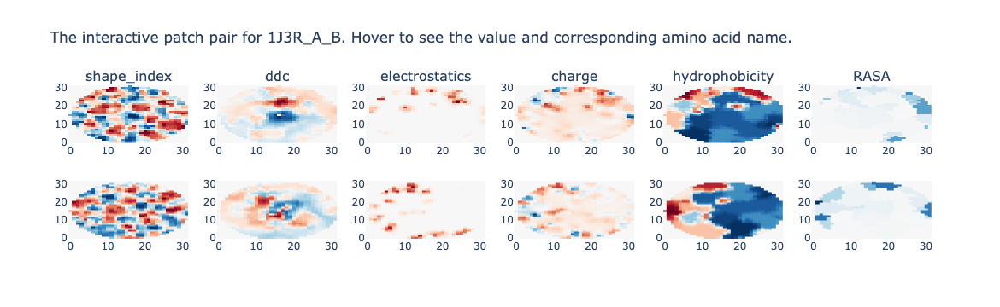

In [28]:
# Visualize the first significant complex

## Positive
masif_test_native.vis_patch("1J3R_A_B", html_path='/results/1J3R_A_B-unmasked.html')


Testing for 1J3R_A_B
Shape Index
Curvature
HB
Charge
Hydropathy
RASA


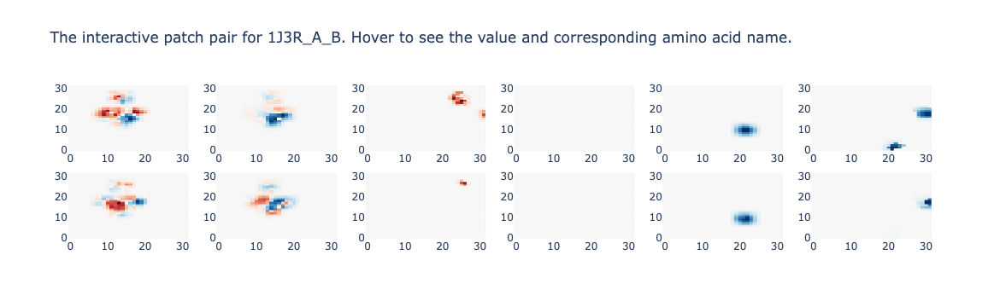

In [29]:
# Positive with attention mask

plot_attn(masif_test_native, "1J3R_A_B", all_attn_native)


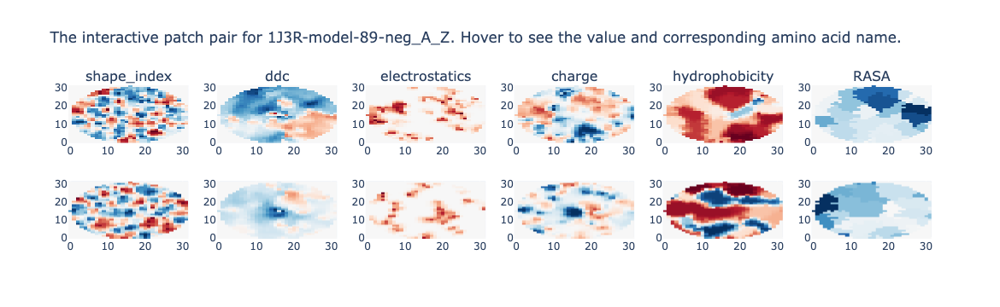

In [30]:
## Negative

masif_test_dataset.vis_patch("1J3R-model-89-neg_A_Z", html_path='/results/1J3R-model-89-neg_A-unmasked.html')


Testing for 1J3R-model-89-neg_A_Z
Shape Index
Curvature
HB
Charge
Hydropathy
RASA


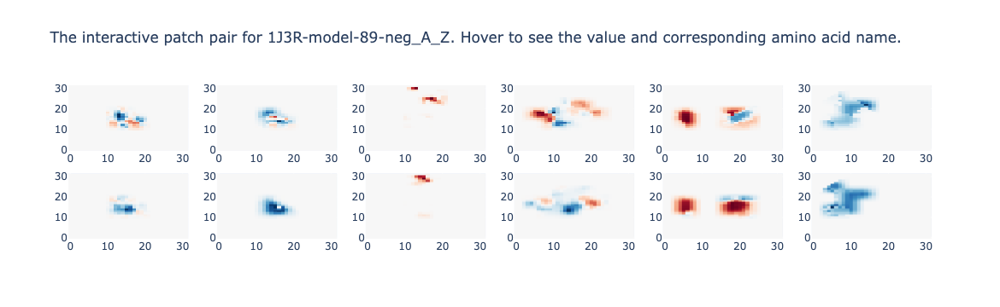

In [31]:
# Negative mask

plot_attn(masif_test_dataset, "1J3R-model-89-neg_A_Z", all_attn)


#### Apply attention map and create PyMol plot

In [32]:
from collections import defaultdict

#### 1J3R_A_B

ppi_idx = masif_test_native.ppi_list.index("1J3R_A_B")
ppi = masif_test_native.ppi_list[ppi_idx]
grid_dir = masif_test_native.grid_dir
spatial_attn = all_attn_native[ppi_idx][0]
print(f"Testing for {ppi}")
all_significant_pixels = get_significant_pixels(ppi, grid_dir, spatial_attn, stat_spatial_attn_dict)
resnames_path = grid_dir + '/' + ppi + '_resnames.npy'
resnames = np.load(resnames_path, allow_pickle=True)

for i, significant_pixels in enumerate(all_significant_pixels):
    feature = list(stat_spatial_attn_dict.keys())[i]
    all_significant_res = set()
    for i in range(resnames.shape[0]):
        for j in range(resnames.shape[1]):
            if significant_pixels[i][j]>0:
                all_significant_res.add(resnames[i][j][0])
                all_significant_res.add(resnames[i][j][1])

    all_significant_res = set([x.split('-')[0] for x in all_significant_res if x!=0])

    ## Generate pymol selection string
    chains_dict = defaultdict(list)
    for res in all_significant_res:
        #ch = res.split(':')[0]
        #atom_indx = res.split('-')[1].split(':')[0]
        ch, resi, resname = res.split(':')
        chains_dict[ch].append(resi)
        #chains_dict[ch].append(atom_indx)

    ## select
    pymol_string=f"select {feature},"
    for ch in chains_dict.keys():
        pymol_string += f" (chain {ch} and resi {','.join(chains_dict[ch])}) or"
        #pymol_string += f" (chain {ch} and index {','.join(chains_dict[ch])}) or"
    pymol_string = pymol_string.strip('or')
    print(pymol_string)
#     print(chains_dict)

        

Testing for 1J3R_A_B
select geometry, (chain A and resi 66,152,156,154,69,99,155,65,68,153,67,97,98,130) or (chain B and resi 7,152,66,60,98,99,69,153,65,67,97,130,154,150) 
select RASA, (chain A and resi 9,13,7,69,58,11,103,101) or (chain B and resi 126,128,101,13,11,103,150) 
select HB, (chain A and resi 9,4,60,66,67,7,69,58) or (chain B and resi 69,101,9,13,7,11,103,18,150) 
select charge,
select hydropathy, (chain B and resi 99,128,101,152) or (chain A and resi 152,18,69,150,11,101) 


# Part 3: CAPRI score set

The interface images were created based on the following dataset:

https://data.sbgrid.org/dataset/843/

## Download pre-processed CAPRI score set:

In [33]:
if not os.path.exists('/data/capri_score/'):
    !wget https://zenodo.org/record/7528054/files/capri_score.tar.gz -P /data/
    !tar xf /data/capri_score.tar.gz -C /data/
    !rm /data/capri_score.tar.gz

## Read the CAPRI dataset

In [34]:
from utils.dataset import PISToN_dataset
import os
import numpy as np


def get_processed(ppi_list, GRID_DIR):
    """
    Output processed protein complexes.
    For a small number of the models, interaction maps failed to preprocess, possibly due to clashes.
    The PIsToN scores for those models will be assigned to "incorrect"
    """
    processed_ppis = []
    for ppi in ppi_list:
        pid, ch1, ch2 = ppi.split('_')
        if os.path.exists(GRID_DIR + '/' + ppi + '.npy'):
            processed_ppis.append(ppi)
    return processed_ppis


CAPRI_DIR = '/data/capri_score/'
GRID_DIR = CAPRI_DIR+'piston_prepare/07-grid/'
CAPRI_LIST_FILE = CAPRI_DIR + 'capri_list_models.txt'

capri_list = [x.strip('\n') for x in open(CAPRI_LIST_FILE, 'r').readlines()]
test_list_updated = get_processed(capri_list, GRID_DIR)

print(f"{len(test_list_updated)}/{len(capri_list)} complexes were processed.")
unprocessed_complexes = set(capri_list) - set(test_list_updated)

print(f"Unprocessed complexes: {unprocessed_complexes}")
print("The PISToN score for those complexes will be assigned to 2 (because smaller number is a better complex).")

unique_pids = list(set([x.split('-')[0] for x in capri_list]))

print(f"Unique targets: {unique_pids}")

capri_dataset = PISToN_dataset(GRID_DIR, test_list_updated)

16581/16585 complexes were processed.
Unprocessed complexes: {'T37-919_A_B', 'T37-1239_A_B', 'T37-515_A_B', 'T37-401_A_B'}
The PISToN score for those complexes will be assigned to 2 (because smaller number is a better complex).
Unique targets: ['T50', 'T40', 'T54', 'T39', 'T53', 'T47', 'T32', 'T46', 'T35', 'T29', 'T41', 'T37', 'T30']
Interaction maps shape: (16581, 13, 32, 32)
All energies shape: (16581, 13)


In [35]:
def read_score_dict(data_dir, score_file_affix, unique_pids, print_labels=False):
    """
    Read the scores file performed by DeepRank
    """
    score_dict = {}
    statistics_dict={"Sample":[], "N_pos":[], "N_neg":[]}
    for pid in unique_pids:
        score_file = f"{data_dir}/{pid}/{pid}.{score_file_affix}"
        all_scores = []
        for line in open(score_file).readlines():
            curr_model, score = line.strip('\n').split('\t')
            model_id = curr_model.split('_')[0] + '-' + curr_model.split('_')[1]
            score = float(score)
            score_dict[model_id] = score
            all_scores.append(score)
        if print_labels:
            print(f"Sample {pid}: {int(np.sum(all_scores))} positives out of {len(all_scores)} models")
            statistics_dict['Sample'].append(pid)
            statistics_dict['N_pos'].append(int(np.sum(all_scores)))
            statistics_dict['N_neg'].append(len(all_scores) - int(np.sum(all_scores)))
    if print_labels:
        df=pd.DataFrame(statistics_dict)
        df.to_csv("/results/capri_dataset.csv")

    return score_dict

labels_dict = read_score_dict(CAPRI_DIR, 'label', unique_pids, print_labels=True) # true labels
dove_dict = read_score_dict(CAPRI_DIR, 'dove', unique_pids) # DOVE scores
deeprank_dict = read_score_dict(CAPRI_DIR, 'deeprank', unique_pids) # DeepRank scores
haddockScore_dict = read_score_dict(CAPRI_DIR, 'haddockScore', unique_pids) # HADDOCK scores
iScore_dict = read_score_dict(CAPRI_DIR, 'iScore', unique_pids) # iScore scores
capri_dict = read_score_dict(CAPRI_DIR, 'capri', unique_pids) # true capri qualities

# assign integer label
for key_i in labels_dict.keys():
    labels_dict[key_i] = int(labels_dict[key_i])
    
# Create labels array
labels = []
for ppi in test_list_updated:
    model_id = ppi.split('_')[0]
    labels.append(labels_dict[model_id])
    
print(f"Total {np.sum(labels)} positive complexes out of {len(labels)}")

Sample T50: 133 positives out of 1447 models
Sample T40: 535 positives out of 1971 models
Sample T54: 19 positives out of 1304 models
Sample T39: 4 positives out of 1287 models
Sample T53: 122 positives out of 1360 models
Sample T47: 608 positives out of 1015 models
Sample T32: 15 positives out of 599 models
Sample T46: 24 positives out of 1570 models
Sample T35: 3 positives out of 497 models
Sample T29: 166 positives out of 1979 models
Sample T41: 347 positives out of 1096 models
Sample T37: 97 positives out of 1364 models
Sample T30: 2 positives out of 1096 models
Total 2075 positive complexes out of 16581


## Inference

In [36]:
capri_loader = DataLoader(capri_dataset, batch_size=128, shuffle=False, pin_memory=False)

from tqdm import tqdm
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device=torch.device("cpu")

# Infer in batches
all_outputs = []
with torch.no_grad():
    for grid, all_energies in tqdm(capri_loader):
        grid = grid.to(device)
        all_energies = all_energies.float().to(device)
        model = model.to(device)
        output, attn = model(grid, all_energies)
        all_outputs.append(output)
output = torch.cat(all_outputs, axis=0)
output

100%|██████████| 130/130 [00:30<00:00,  4.30it/s]


tensor([ 0.2456,  0.9261,  1.9602,  ...,  0.2290, -0.6003,  0.7949])

## Compute AUC

In [37]:
import torch.nn.functional as F
from sklearn import metrics

pred_probabilities = list(output.cpu().detach().numpy())

# append unprocessed complexes
pred_probabilities = pred_probabilities + [1 for x in list(unprocessed_complexes)]
all_capri_complexes = test_list_updated + list(unprocessed_complexes)
true_labels = labels + [labels_dict[x.split('_')[0]] for x in list(unprocessed_complexes)]

def assign_score(score_dict, all_capri_complexes):
    score = []
    for ppi in all_capri_complexes:
        model_id = ppi.split('_')[0]
        score.append(score_dict[model_id])
    return score
        
dove_scores = assign_score(dove_dict, all_capri_complexes)
deeprank_scores = assign_score(deeprank_dict, all_capri_complexes)
haddockScore_scores = assign_score(haddockScore_dict, all_capri_complexes)
iScore_scores = assign_score(iScore_dict, all_capri_complexes)

auc = metrics.roc_auc_score(true_labels, pred_probabilities)
print(f"Final test AUC for CAPRI dataset of {MODEL_NAME}: {1-auc}")
        
auc = metrics.roc_auc_score(true_labels, dove_scores)
print(f"DOVE AUC for CAPRI dataset: {auc}")

auc = metrics.roc_auc_score(true_labels, deeprank_scores)
print(f"DeepRank AUC for CAPRI dataset: {1-auc}")

auc = metrics.roc_auc_score(true_labels, haddockScore_scores)
print(f"HADDOCK AUC for CAPRI dataset: {1-auc}")

auc = metrics.roc_auc_score(true_labels, iScore_scores)
print(f"iSCORE AUC for CAPRI dataset: {1-auc}")

capri_dict = read_score_dict(CAPRI_DIR, 'capri', unique_pids) 
capri_labels = assign_score(capri_dict, all_capri_complexes)

import pandas as pd

df = {"PISToN":pred_probabilities, 
      "DOVE": dove_scores, 
      "DeepRank": deeprank_scores, 
      "iSCORE": iScore_scores, 
      "HADDOCK": haddockScore_scores,
      "label": true_labels,
      "capri_quality": capri_labels,
     "model_name": all_capri_complexes,
     #"target": 
     }

df = pd.DataFrame(df)
df['target'] = df['model_name'].apply(lambda x: x.split('-')[0])
df

Final test AUC for CAPRI dataset of PIsToN_multiAttn_contrast: 0.8126360881153837
DOVE AUC for CAPRI dataset: 0.5638840517134008
DeepRank AUC for CAPRI dataset: 0.7222781131417468
HADDOCK AUC for CAPRI dataset: 0.703525761211628
iSCORE AUC for CAPRI dataset: 0.7351248578047545


,PISToN,DOVE,DeepRank,iSCORE,HADDOCK,label,capri_quality,model_name,target
0,0.245604,0.0031,0.093072,-0.453,-66.65310,0,4.0,T29-0_A_B,T29
1,0.926115,0.2474,0.242705,-0.568,-65.60780,0,4.0,T29-1000_A_B,T29
2,1.960213,0.0617,0.992702,0.116,-76.41506,0,4.0,T29-1001_A_B,T29
3,1.523463,0.0062,0.154322,-0.292,9.46515,0,4.0,T29-1002_A_B,T29
4,1.959803,0.0125,0.992147,-0.680,-50.94296,0,4.0,T29-1003_A_B,T29
...,...,...,...,...,...,...,...,...,...
16580,0.794902,0.0453,1.000000,0.339,242.38618,0,4.0,T54-9_A_B,T54
16581,1.000000,0.0035,0.999965,0.174,237.10611,0,4.0,T37-919_A_B,T37
16582,1.000000,0.1457,0.972651,-0.808,-59.38579,0,4.0,T37-1239_A_B,T37
16583,1.000000,0.0068,0.999997,-0.436,697.20496,0,4.0,T37-515_A_B,T37


/tmp/ipykernel_71/1402674885.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



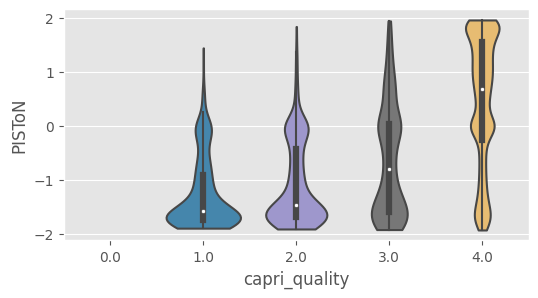

In [38]:
df_tmp = df.copy().append({"PISToN":None, 
      "DOVE": None, 
      "DeepRank": None, 
      "iSCORE": None, 
      "HADDOCK": None,
      "label": None,
      "capri_quality": 0,
     "model_name": None,}, ignore_index=True)

## Violin plot
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
#sns.set_style('whitegrid')
plt.subplots(figsize=(6, 3))

# sns.kdeplot(data=scores_df, x='PIsToN_score', hue='CAPRI_quality', fill=True)
# #sns.despine()
# plt.show()
gfg = sns.violinplot(data=df_tmp, x='capri_quality', y='PISToN', cut=0)
plt.savefig('/results/violin_CAPRI_PiSTON.png',dpi=600)


## Plot AUC

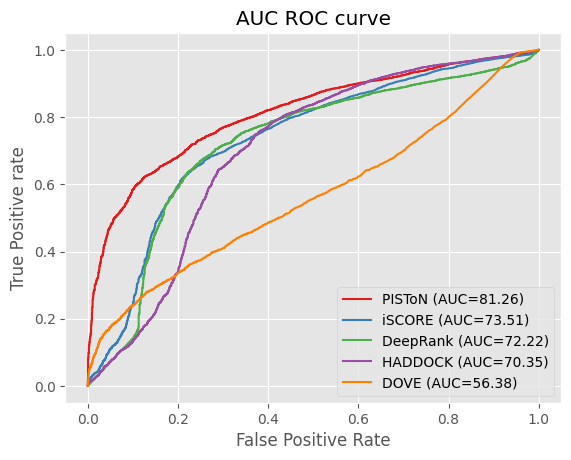

In [39]:
def plot_ROC(df, score_name, label_name, model_name, ax, color, pos_label):
    fpr, tpr, thresh = roc_curve(df[label_name], df[score_name], pos_label=pos_label)
    AUC = metrics.auc(fpr, tpr)
    ax.plot(fpr, tpr, linestyle='-',color=color, label=f'{model_name} (AUC={int(AUC*10000)/100})')

    # matplotlib
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('ggplot')

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

colors = matplotlib.cm.Set1(range(9))

fig, ax = plt.subplots()

other_labels = ['PISToN', 'iSCORE', 'DeepRank', 'HADDOCK', 'DOVE']
pos_labels = [0,0,0,0,1]
colors_array = ['r', 'c', 'm', 'y', 'black']
for i in range(len(other_labels)):
    plot_ROC(df, other_labels[i], 'label', other_labels[i], ax, colors[i], pos_label=pos_labels[i])



# # title
plt.title('AUC ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig(f'/results/AUC_CAPRI_{MODEL_NAME}.png',dpi=600)
plt.show();

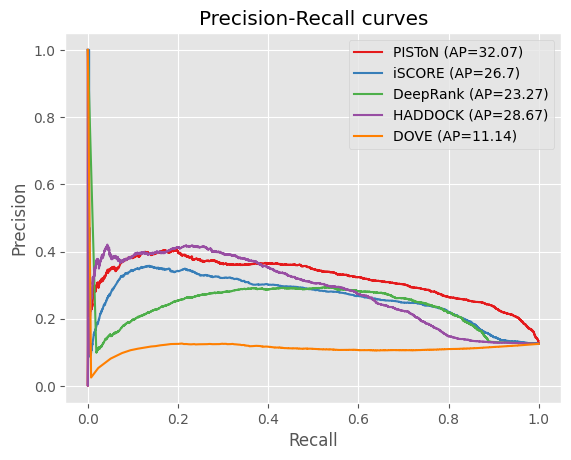

In [40]:
from sklearn.metrics import precision_recall_curve, auc, average_precision_score

def plot_AUPRC(df, score_name, label_name, model_name, ax, color, reverse_sign=False):
    # Precision-Recall curve
    pred_scores = - df[score_name] if reverse_sign else df[score_name]
    precision, recall, thresholds = precision_recall_curve(df[label_name], pred_scores)
    AP = average_precision_score(df[label_name], pred_scores)
    ax.plot(recall, precision, linestyle='-',color=color, label=f'{model_name} (AP={int(AP*10000)/100})')      

fig, ax = plt.subplots()
other_labels = ['PISToN', 'iSCORE', 'DeepRank', 'HADDOCK', 'DOVE']
reverse_sign = [1,1,1,1,1]
colors_array = ['r', 'c', 'm', 'y', 'black']
for i in range(len(other_labels)):
    plot_AUPRC(df, other_labels[i], 'label', other_labels[i], ax, colors[i], reverse_sign=reverse_sign[i])


# # title
plt.title('Precision-Recall curves')
# x label
plt.xlabel('Recall')
# y label
plt.ylabel('Precision')

plt.legend(loc='best')
plt.savefig(f'/results/out_CAPRI_AUPRC_{MODEL_NAME}.png',dpi=600)
plt.show();

## Success rate

,model,top1,top3,top5,top10,top25,top100,top200
0,PISToN,38,38,46,69,76,76,100
1,HADDOCK,23,23,23,46,53,69,76
2,DeepRank,15,30,30,46,61,69,92
3,iSCORE,38,46,46,53,61,76,84
4,DOVE,0,15,15,15,46,46,69


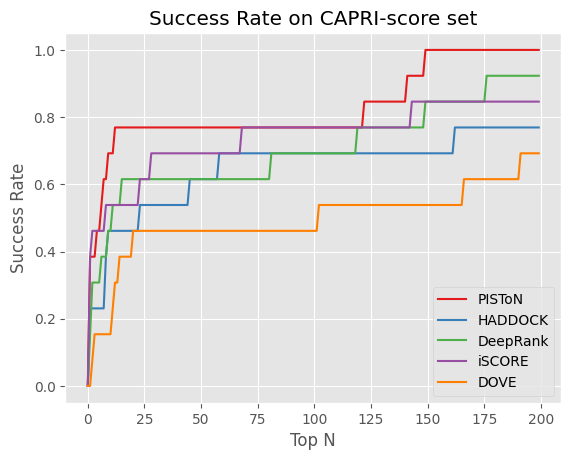

In [41]:
import numpy as np

all_targets = list(df['target'].unique())

def compute_success_rate(method, ascending, ax, color):
    hits_target = np.zeros(200)
    for target in all_targets:
        target_df = df[df['target']==target]
        target_df = target_df.sort_values(by=method, ascending=ascending).reset_index(drop=True)
        for i in range(1, 200):
            if 1 in list(target_df[:i]['label']):
                for j in range(i, 200):
                    hits_target[j] += 1/len(all_targets)
                break
    ax.plot(range(200), hits_target, linestyle='-',color=color, label=f'{method}')
    return hits_target

colors = matplotlib.cm.Set1(range(9))

fig, ax = plt.subplots()

compute_success_rate('PISToN', True, ax, colors[0])

methods = ['HADDOCK', 'DeepRank', 'iSCORE', 'DOVE']

for i,method in enumerate(methods):
    compute_success_rate(method, True, ax, colors[i+1])
            
 # # title
plt.title('Success Rate on CAPRI-score set')
# x label
plt.xlabel('Top N')
# y label
plt.ylabel('Success Rate')

plt.legend(loc='best')           
plt.savefig(f'/results/SUCCESS_RATE_{MODEL_NAME}.png',dpi=600)


def compute_success_rate(method, ascending):
    top1 = 0
    top3 = 0
    top5=0
    top10 = 0
    top25 = 0
    top100= 0
    top200 = 0
    for target in all_targets:
        target_df = df[df['target']==target]
        target_df = target_df.sort_values(by=method, ascending=ascending).reset_index(drop=True)
        if 1 in list(target_df[:1]['label']):
             top1+=1
        if 1 in list(target_df[:3]['label']):
             top3+=1
        if 1 in list(target_df[:5]['label']):
             top5+=1
        if 1 in list(target_df[:10]['label']):
            top10+=1
        if 1 in list(target_df[:25]['label']):
            top25+=1
        if 1 in list(target_df[:100]['label']):
             top100+=1
        if 1 in list(target_df[:200]['label']):
            top200+=1
    all_success_rate = [top1,top3, top5, top10, top25, top100, top200]
    #all_success_rate = [top10, top25, top200]

    all_success_rate = [int(x*100/len(all_targets)) for x in all_success_rate]
#     print(method)
#     print(all_success_rate)
    #print(f"Top1: {all_success_rate[0]} Top10: {all_success_rate[1]}; Top25: {all_success_rate[[2]]}; Top100: {all_success_rate[3]}; Top200: {all_success_rate[4]}")
    return all_success_rate


#compute_success_rate('PISToN', True)
methods = ['PISToN', 'HADDOCK', 'DeepRank', 'iSCORE', 'DOVE']
all_scores = []
for method in methods:
    all_scores.append([method]+compute_success_rate(method, True))

df_rank = pd.DataFrame(all_scores, columns=['model','top1','top3', 'top5', 'top10', 'top25', 'top100', 'top200'])
df_rank


In [42]:
df_rank

,model,top1,top3,top5,top10,top25,top100,top200
0,PISToN,38,38,46,69,76,76,100
1,HADDOCK,23,23,23,46,53,69,76
2,DeepRank,15,30,30,46,61,69,92
3,iSCORE,38,46,46,53,61,76,84
4,DOVE,0,15,15,15,46,46,69


## Other classification metrics

accuracy, precision, F1-score, and recall

In [43]:
# redifine data frame with scores
df = {"PISToN":pred_probabilities, 
      "DOVE": dove_scores, 
      "DeepRank": deeprank_scores, 
      "iSCORE": iScore_scores, 
      "HADDOCK": haddockScore_scores,
      "label": true_labels,
      "capri_quality": capri_labels,
     "model_name": all_capri_complexes,
     #"target": 
     }

df = pd.DataFrame(df)
df['target'] = df['model_name'].apply(lambda x: x.split('-')[0])
df

,PISToN,DOVE,DeepRank,iSCORE,HADDOCK,label,capri_quality,model_name,target
0,0.245604,0.0031,0.093072,-0.453,-66.65310,0,4.0,T29-0_A_B,T29
1,0.926115,0.2474,0.242705,-0.568,-65.60780,0,4.0,T29-1000_A_B,T29
2,1.960213,0.0617,0.992702,0.116,-76.41506,0,4.0,T29-1001_A_B,T29
3,1.523463,0.0062,0.154322,-0.292,9.46515,0,4.0,T29-1002_A_B,T29
4,1.959803,0.0125,0.992147,-0.680,-50.94296,0,4.0,T29-1003_A_B,T29
...,...,...,...,...,...,...,...,...,...
16580,0.794902,0.0453,1.000000,0.339,242.38618,0,4.0,T54-9_A_B,T54
16581,1.000000,0.0035,0.999965,0.174,237.10611,0,4.0,T37-919_A_B,T37
16582,1.000000,0.1457,0.972651,-0.808,-59.38579,0,4.0,T37-1239_A_B,T37
16583,1.000000,0.0068,0.999997,-0.436,697.20496,0,4.0,T37-515_A_B,T37


In [44]:
all_results = []
all_thresholds = []
all_matthews = []

for i in range(len(methods)):
    print("")
    print(methods[i])
    thresholds, matthews, metrics = find_optimal_threshold(df, methods[i], 'label', reverse_sign=True)
    all_results.append([other_labels[i]]+metrics)
    all_thresholds.append([other_labels[i]]+thresholds)
    all_matthews.append([other_labels[i]]+matthews)
    
metrics_df = pd.DataFrame(all_results, columns=['Method','BA','F1', 'Precision', 'Recall'])
metrics_df.to_csv('/results/classification_capri_test.csv', index=False)
metrics_df


PISToN
Optimal threshold: -0.4963009774684906; BA=0.732000531415808, F1=0.4221238938053098, Precision=0.30414452709883105; Recall=0.6896385542168675

HADDOCK
Optimal threshold: -110.192209; BA=0.6753657220197122, F1=0.38240448650543285, Precision=0.30046819058110713; Recall=0.5257831325301204

DeepRank
Optimal threshold: 0.053395000000000005; BA=0.7057572260094824, F1=0.38796270132805877, Precision=0.27443533879672194; Recall=0.6616867469879518

iSCORE
Optimal threshold: -0.11210000000000002; BA=0.6988440045502479, F1=0.3663068039166457, Precision=0.24766593108131046; Recall=0.7031325301204819

DOVE
Optimal threshold: 0.19138; BA=0.4300729036061544, F1=0.18828779928834208, Precision=0.10761064387150145; Recall=0.752289156626506


,Method,BA,F1,Precision,Recall
0,PISToN,0.732001,0.422124,0.304145,0.689639
1,iSCORE,0.675366,0.382404,0.300468,0.525783
2,DeepRank,0.705757,0.387963,0.274435,0.661687
3,HADDOCK,0.698844,0.366307,0.247666,0.703133
4,DOVE,0.430073,0.188288,0.107611,0.752289


In [45]:
## optimal thresholds
thresholds_df = pd.DataFrame(all_thresholds, columns=['Method']+list(range(1,11)))
thresholds_df.to_csv('/results/thresholds_capri.csv', index=False)
## best matthews correlation scores
matthews_df = pd.DataFrame(all_matthews, columns=['Method']+list(range(1,11)))
matthews_df.to_csv('/results/matthews_capri.csv', index=False)


In [46]:
thresholds_df

,Method,1,2,3,4,5,6,7,8,9,10
0,PISToN,-1.406410,0.079773,-0.629372,-0.921315,-0.418988,-0.469701,0.064424,-0.223725,-1.193780,0.156083
1,iSCORE,-122.867300,-100.813770,-99.798900,-121.356490,-146.547900,-104.299420,-104.270640,-92.585200,-133.454100,-75.928370
2,DeepRank,0.051547,0.048254,0.051725,0.052787,0.051518,0.050392,0.055077,0.066699,0.061762,0.044189
3,HADDOCK,0.079000,-0.302000,0.002000,-0.403000,-0.028000,0.042000,-0.085000,-0.274000,-0.060000,-0.092000
4,DOVE,0.001400,0.976800,0.922500,0.001800,0.000000,0.004000,0.001200,0.004000,0.000700,0.001400


In [47]:
matthews_df

,Method,1,2,3,4,5,6,7,8,9,10
0,PISToN,0.420287,0.346125,0.363438,0.381823,0.351623,0.365109,0.361969,0.357706,0.334367,0.324509
1,iSCORE,0.339053,0.268510,0.288762,0.375627,0.312393,0.303881,0.331619,0.271083,0.304926,0.252657
2,DeepRank,0.342029,0.280196,0.306138,0.354704,0.281071,0.287397,0.265153,0.321584,0.325695,0.285258
3,HADDOCK,0.280173,0.301925,0.273038,0.344733,0.256757,0.281255,0.303478,0.291908,0.291078,0.299008
4,DOVE,0.034593,0.009476,0.013441,0.029238,0.000000,0.005976,0.004662,0.048164,0.010948,0.024908
